In [1]:
# import
import os
import math


import numpy as np
import scipy as sp
from matplotlib import pyplot as plt

import suite2p as s2p
from suite2p.registration import bidiphase, utils, rigid, nonrigid

import TwoPUtils

%matplotlib inline

In [ ]:
class session_aligner:
    
    def __init__(self, ref_sess, targ_sess):
        
        
        self.ref_sess = ref_sess
        self.targ_sess = targ_sess
        
        sel
        
    def align_mean_images():
        # get mean images
        
        # stack into frames
        pass
    
    def apply_roi_shifts():
        pass
    
    def get_com():
        pass
    
    def get_candidates():
        pass
    
    def calculate_iou():
        
        pass
    
    def get matches():
        
        pass
    
    def get_tracked_whole_time():
        # find cells that are in match list each time
        pass
    
    def set_threshold():
        
        # find max on each row
        
        # set to zero
        
        # find max again (2nd largest number)
        
        
        # set threshold to max of these 2nd tier maxes
        
        
        
        
        
    

In [49]:
def align_stack(refImg,target_frames, ref_ops):
   
    maskMul, maskOffset = rigid.compute_masks(
        refImg=refImg,
        maskSlope=ops['spatial_taper'] if ops['1Preg'] else 3 * ops['smooth_sigma'],
    )

    print(maskOffset)
    cfRefImg = rigid.phasecorr_reference(
        refImg=refImg,
        smooth_sigma=ops['smooth_sigma'],
        pad_fft=ops['pad_fft'],
    )


    if ops.get('nonrigid'):
        if 'yblock' not in ops:
            ops['yblock'], ops['xblock'], ops['nblocks'], ops['block_size'], ops[
                'NRsm'] = nonrigid.make_blocks(Ly=ops['Ly'], Lx=ops['Lx'], block_size=ops['block_size'])

        maskMulNR, maskOffsetNR, cfRefImgNR = nonrigid.phasecorr_reference(
            refImg0=refImg,
            maskSlope=ops['spatial_taper'] if ops['1Preg'] else 3 * ops['smooth_sigma'], # slope of taper mask at the edges
            smooth_sigma=ops['smooth_sigma'],
            yblock=ops['yblock'],
            xblock=ops['xblock'],
            pad_fft=ops['pad_fft'],
        )

    # ### ------------- register binary to reference image ------------ ###

    mean_img = np.zeros((ops['Ly'], ops['Lx']))
    rigid_offsets, nonrigid_offsets = [], []



    fsmooth = frames.copy().astype(np.float32)
    if ops['smooth_sigma_time'] > 0:
        fsmooth = utils.temporal_smooth(data=fsmooth, sigma=ops['smooth_sigma_time'])


    # rigid registration
    if ops.get('norm_frames', False):
        fsmooth = np.clip(fsmooth, rmin, rmax)


    ymax, xmax, cmax = rigid.phasecorr(
        data=rigid.apply_masks(data=fsmooth, maskMul=maskMul, maskOffset=maskOffset),
        cfRefImg=cfRefImg,
        maxregshift=ops['maxregshift'],
        smooth_sigma_time=ops['smooth_sigma_time'],
    )
    rigid_offsets.append([ymax, xmax, cmax])

    # for frame, frame_chan2, dy, dx in zip(frames, frames_chan2, ymax, xmax):
    for frame, dy, dx in zip(frames, ymax, xmax):
        frame[:] = rigid.shift_frame(frame=frame, dy=dy, dx=dx)
    #     frame_chan2[:] = rigid.shift_frame(frame=frame_chan2, dy=dy, dx=dx)



    # non-rigid registration
    if ops['nonrigid']:
        # need to also shift smoothed data (if smoothing used)
        if ops['smooth_sigma_time'] or ops['1Preg']:
            for fsm, dy, dx in zip(fsmooth, ymax, xmax):
                fsm[:] = rigid.shift_frame(frame=fsm, dy=dy, dx=dx)
        else:
            fsmooth = frames.copy()

        if ops.get('norm_frames', False):
            fsmooth = np.clip(fsmooth, rmin, rmax)

        ymax1, xmax1, cmax1 = nonrigid.phasecorr(
            data=fsmooth,
            maskMul=maskMulNR.squeeze(),
            maskOffset=maskOffsetNR.squeeze(),
            cfRefImg=cfRefImgNR.squeeze(),
            snr_thresh=ops['snr_thresh'],
            NRsm=ops['NRsm'],
            xblock=ops['xblock'],
            yblock=ops['yblock'],
            maxregshiftNR=10,
        )

        frames = nonrigid.transform_data(
            data=frames,
            nblocks=ops['nblocks'],
            xblock=ops['xblock'],
        yblock=ops['yblock'],
        ymax1=ymax1,
        xmax1=xmax1,
    )
    
#     frames_chan2 = nonrigid.transform_data(
#         data=frames_chan2,
#         nblocks=ops['nblocks'],
#         xblock=ops['xblock'],
#         yblock=ops['yblock'],
#         ymax1=ymax1,
#         xmax1=xmax1,
#     )

#     nonrigid_offsets.append([ymax1, xmax1, cmax1])

    return rigid_shifts, nonrigid_shifts

In [50]:
# example mouse
basedir = "/mnt/BigDisk/2P_scratch"
mouse = '4467975.1'

file_list = ({'date': '28_09_2020', 'scene':'combined'},
             {'date': '29_09_2020', 'scene':'YMaze_LNovel','session':1,'scan':3},
             {'date': '30_09_2020', 'scene':'YMaze_LNovel','session':1,'scan':4},
             {'date': '01_10_2020', 'scene':'YMaze_LNovel','session':1,'scan':2},
             {'date': '02_10_2020', 'scene':'YMaze_LNovel','session':1,'scan':3},
             {'date': '03_10_2020', 'scene':'YMaze_LNovel','session':1,'scan':3},
             {'date': '04_10_2020', 'scene':'combined'},
             {'date': '05_10_2020', 'scene':'YMaze_RewardReversal','session':1,'scan':3},
             {'date': '06_10_2020', 'scene':'combined'},
             )



In [51]:
# for each session

sessions = []
meanImgs = []
meanImgs_chan2 = []
for f in file_list:
   
    if f['scene'] in ('combined'):
        s2p_path = os.path.join(basedir,mouse,f['date'], f['scene'],'suite2p','plane0')
    else:
        s2p_path = os.path.join(basedir,mouse,f['date'],f['scene'],"%s_%03d_%03d" % (f['scene'],f['session'],f['scan']),'suite2p','plane0')
    
    

    ops = np.load(os.path.join(s2p_path,'ops.npy'),allow_pickle=True).all()
    f['ops'] = ops
    f['stats'] = np.load(os.path.join(s2p_path,'stat.npy'),allow_pickle=True)
    f['iscell'] = np.load(os.path.join(s2p_path,'iscell.npy'))
  
    roistack = np.zeros([f['stats'].shape[0],f['ops']['Ly'],f['ops']['Lx']]).astype(np.float32)
    for i, roi in enumerate(f['stats']):
        roistack[i,roi['ypix'],roi['xpix']]=1
    f['roistack']=roistack

In [52]:
ops = file_list[0]['ops']
ops['block_size']=[64,64]

refImg = file_list[0]['ops']['meanImg']
rmin, rmax = np.percentile(refImg,1), np.percentile(refImg,99)
refImg = np.clip(refImg, rmin, rmax).astype(np.float32)
frames = np.array([_f['ops']['meanImg'] for _f in file_list[:3]]).astype(np.float32)

maskMul, maskOffset = rigid.compute_masks(
    refImg=refImg,
    maskSlope=ops['spatial_taper'] if ops['1Preg'] else 3 * ops['smooth_sigma'],
)

print(maskOffset)
cfRefImg = rigid.phasecorr_reference(
    refImg=refImg,
    smooth_sigma=ops['smooth_sigma'],
    pad_fft=ops['pad_fft'],
)


if ops.get('nonrigid'):
    if 'yblock' not in ops:
        ops['yblock'], ops['xblock'], ops['nblocks'], ops['block_size'], ops[
            'NRsm'] = nonrigid.make_blocks(Ly=ops['Ly'], Lx=ops['Lx'], block_size=ops['block_size'])

    maskMulNR, maskOffsetNR, cfRefImgNR = nonrigid.phasecorr_reference(
        refImg0=refImg,
        maskSlope=ops['spatial_taper'] if ops['1Preg'] else 3 * ops['smooth_sigma'], # slope of taper mask at the edges
        smooth_sigma=ops['smooth_sigma'],
        yblock=ops['yblock'],
        xblock=ops['xblock'],
        pad_fft=ops['pad_fft'],
    )

# ### ------------- register binary to reference image ------------ ###

mean_img = np.zeros((ops['Ly'], ops['Lx']))
rigid_offsets, nonrigid_offsets = [], []



fsmooth = frames.copy().astype(np.float32)
if ops['smooth_sigma_time'] > 0:
    fsmooth = utils.temporal_smooth(data=fsmooth, sigma=ops['smooth_sigma_time'])


# rigid registration
if ops.get('norm_frames', False):
    fsmooth = np.clip(fsmooth, rmin, rmax)

    
ymax, xmax, cmax = rigid.phasecorr(
    data=rigid.apply_masks(data=fsmooth, maskMul=maskMul, maskOffset=maskOffset),
    cfRefImg=cfRefImg,
    maxregshift=ops['maxregshift'],
    smooth_sigma_time=ops['smooth_sigma_time'],
)
rigid_offsets.append([ymax, xmax, cmax])

# for frame, frame_chan2, dy, dx in zip(frames, frames_chan2, ymax, xmax):
for frame, dy, dx in zip(frames, ymax, xmax):
    frame[:] = rigid.shift_frame(frame=frame, dy=dy, dx=dx)
#     frame_chan2[:] = rigid.shift_frame(frame=frame_chan2, dy=dy, dx=dx)
    
    
    
# non-rigid registration
if ops['nonrigid']:
    # need to also shift smoothed data (if smoothing used)
    if ops['smooth_sigma_time'] or ops['1Preg']:
        for fsm, dy, dx in zip(fsmooth, ymax, xmax):
            fsm[:] = rigid.shift_frame(frame=fsm, dy=dy, dx=dx)
    else:
        fsmooth = frames.copy()

    if ops.get('norm_frames', False):
        fsmooth = np.clip(fsmooth, rmin, rmax)

    ymax1, xmax1, cmax1 = nonrigid.phasecorr(
        data=fsmooth,
        maskMul=maskMulNR.squeeze(),
        maskOffset=maskOffsetNR.squeeze(),
        cfRefImg=cfRefImgNR.squeeze(),
        snr_thresh=ops['snr_thresh'],
        NRsm=ops['NRsm'],
        xblock=ops['xblock'],
        yblock=ops['yblock'],
        maxregshiftNR=10,
    )

    frames = nonrigid.transform_data(
        data=frames,
        nblocks=ops['nblocks'],
        xblock=ops['xblock'],
        yblock=ops['yblock'],
        ymax1=ymax1,
        xmax1=xmax1,
    )
    
#     frames_chan2 = nonrigid.transform_data(
#         data=frames_chan2,
#         nblocks=ops['nblocks'],
#         xblock=ops['xblock'],
#         yblock=ops['yblock'],
#         ymax1=ymax1,
#         xmax1=xmax1,
#     )

#     nonrigid_offsets.append([ymax1, xmax1, cmax1])



[[3728.6362 3713.3328 3694.6345 ... 3694.6345 3713.3328 3728.6362]
 [3713.3328 3693.6719 3669.6494 ... 3669.6494 3693.6719 3713.3328]
 [3694.6345 3669.6494 3639.122  ... 3639.122  3669.6494 3694.6345]
 ...
 [3694.6345 3669.6494 3639.122  ... 3639.122  3669.6494 3694.6345]
 [3713.3328 3693.6719 3669.6494 ... 3669.6494 3693.6719 3713.3328]
 [3728.6362 3713.3328 3694.6345 ... 3694.6345 3713.3328 3728.6362]]


In [53]:
print(xmax1.shape)

(3, 60)


In [54]:
index = -1
f = file_list[index]
roistack = f['roistack']

for roi in range(roistack.shape[0]):
#     print(roistack[roi,:,:].shape)
    roistack[roi,:,:] = rigid.shift_frame(frame=roistack[roi,:,:],dy=ymax[index],dx=xmax[index])
    
    roistack[roi,:,:] = nonrigid.transform_data(
        data=roistack[roi:roi+1,:,:,],
        nblocks=ops['nblocks'],
        xblock=ops['xblock'],
        yblock=ops['yblock'],
        ymax1=ymax1[index:index+1,:],
        xmax1=xmax1[index:index+1,:],
    )
    
# frame, dy, dx in zip(frames, ymax, xmax):
# frame[:] = rigid.shift_frame(frame=frame, dy=dy, dx=dx)

In [55]:
roistack_ref = file_list[0]['roistack'][file_list[0]['iscell'][:,0]>0,:,:]>0
com_ref = np.zeros([roistack_ref.shape[0],2])
for ind in range(roistack_ref.shape[0]):
    com_ref[ind,:] = np.argwhere(roistack_ref[ind,:,:]).mean(axis=0)
    


roistack_targ = roistack[file_list[index]['iscell'][:,0]>0,:,:]>0
com_targ = np.zeros([roistack_targ.shape[0],2])
for ind in range(roistack_targ.shape[0]):
    com_targ[ind,:] = np.argwhere(roistack_targ[ind,:,:]).mean(axis=0)
    

dist = np.linalg.norm(com_ref[:,np.newaxis,:] - com_targ[np.newaxis,:,:],ord=2,axis=-1)
candidates = dist<10

/home/mplitt/anaconda3/envs/STX3/lib/python3.7/site-packages/ipykernel_launcher.py:8: RuntimeWarning: invalid value encountered in greater
  
/home/mplitt/anaconda3/envs/STX3/lib/python3.7/site-packages/ipykernel_launcher.py:11: RuntimeWarning: Mean of empty slice.
  # This is added back by InteractiveShellApp.init_path()
/home/mplitt/anaconda3/envs/STX3/lib/python3.7/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in less
  from ipykernel import kernelapp as app


In [56]:
print((dist<10).sum())
print(candidates.shape)
print(roistack_ref.shape,roistack_targ.shape)

1858
(739, 1159)
(739, 512, 796) (1159, 512, 796)


/home/mplitt/anaconda3/envs/STX3/lib/python3.7/site-packages/ipykernel_launcher.py:1: RuntimeWarning: invalid value encountered in less
  """Entry point for launching an IPython kernel.


In [57]:
roistack_ref = np.reshape(roistack_ref,[roistack_ref.shape[0],-1])
roistack_targ = np.reshape(roistack_targ,[roistack_targ.shape[0],-1])

In [58]:
# intxn = np.matmul(roistack_ref,roistack_targ.T)


iou = np.zeros([roistack_ref.shape[0],roistack_targ.shape[0]])
for i in range(roistack_ref.shape[0]):
    
    intxn = (roistack_ref[i:i+1,:]*roistack_targ[candidates[i,:],:]).sum(axis=-1)
    union = (roistack_ref[i:i+1,:] + roistack_targ[candidates[i,:],:]).sum(axis=-1)
    iou[i,candidates[i,:]] = intxn/union
#         ovlp_mat[i,j] = (roistack_ref[i,:,:]*roistack_targ[j,:,:]).sum()/(roistack_ref[i,:,:].sum())

0.66


(array([162.,  92.,  94.,  63.,  79.,  88., 103.,  48.,   9.,   1.]),
 array([0.   , 0.066, 0.132, 0.198, 0.264, 0.33 , 0.396, 0.462, 0.528,
        0.594, 0.66 ]),
 <BarContainer object of 10 artists>)

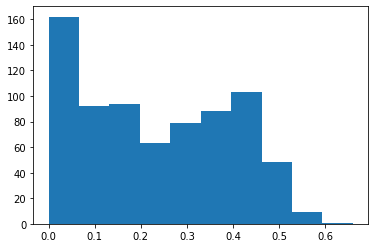

In [59]:
# print(iou[5,:])
print(np.amax(iou))
fig,ax = plt.subplots()
ax.hist(np.amax(iou,axis=1))

In [60]:
match_mat = iou>.3
print(match_mat.sum(axis=-1))
# print(match_mat.sum(axis=-1))


[0 0 1 1 1 1 1 1 1 0 1 1 0 0 0 1 1 1 1 1 1 1 0 1 1 1 0 1 1 1 1 0 0 1 0 0 1
 1 1 1 0 0 0 1 1 0 1 1 1 1 0 1 0 1 0 1 1 0 0 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1
 0 1 0 0 1 1 0 1 1 1 0 1 1 1 1 1 0 0 0 1 1 1 1 0 1 0 1 1 1 0 0 0 1 1 1 1 1
 1 0 1 1 1 0 1 1 1 1 0 1 0 1 0 0 0 0 0 0 0 1 1 0 1 1 1 1 1 1 1 1 1 0 0 0 0
 0 1 1 1 1 1 1 1 0 0 1 0 1 0 0 0 1 0 0 1 1 0 1 0 0 0 1 0 0 0 0 0 1 0 1 0 1
 1 0 0 0 1 0 0 0 0 1 1 1 1 0 1 1 0 1 1 0 0 1 0 0 1 1 1 1 0 1 0 0 0 1 0 0 0
 0 0 0 0 0 0 0 0 0 1 1 1 1 0 0 1 0 1 0 0 0 1 1 0 1 0 0 0 1 0 1 0 0 1 1 0 0
 0 0 0 1 0 1 1 1 1 1 0 1 1 0 1 1 1 1 1 1 1 0 1 0 0 1 0 1 0 0 0 1 0 1 1 0 0
 0 0 1 1 0 1 1 0 0 1 1 0 0 0 0 0 1 0 0 1 1 0 1 0 1 1 0 0 1 1 0 0 1 0 1 1 0
 0 1 0 0 0 0 0 0 1 0 0 1 1 0 0 1 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 1 0 1 0 0 1
 0 1 0 1 1 1 0 1 1 0 0 0 0 0 0 1 0 0 0 0 0 1 0 1 0 0 0 2 0 0 0 0 0 1 0 0 0
 1 1 1 2 0 0 1 0 1 1 0 1 0 0 1 0 0 0 0 0 0 0 0 1 1 1 1 0 0 0 0 1 0 0 0 0 0
 0 1 0 0 1 1 1 1 0 1 0 0 0 0 1 0 1 0 0 1 0 1 0 0 0 0 0 0 1 1 0 0 0 1 0 0 0
 1 0 0 0 1 0 0 0 0 0 0 0 

In [63]:
row_sort, col_sort = np.unravel_index(np.argsort(iou, axis=None), iou.shape)

matched_ref, matched_targ = [], []
thresh = .3
for i,j in zip(row_sort[::-1],col_sort[::-1]):
    if (i not in matched_ref) and (j not in matched_targ) and (iou[i,j]>thresh):
        matched_ref.append(i)
        matched_targ.append(j)
        

In [64]:
print(len(matched_ref),len(matched_targ))

285 285


/home/mplitt/anaconda3/envs/STX3/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  # Remove the CWD from sys.path while we load stuff.


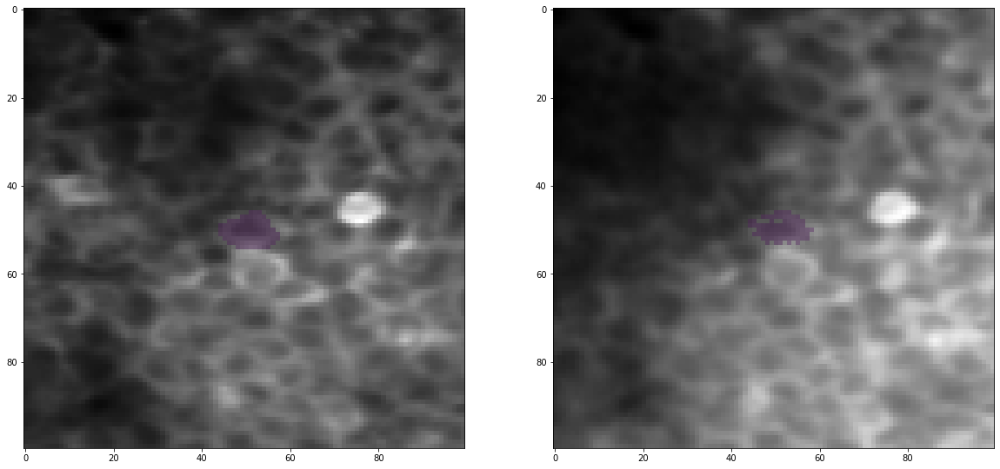

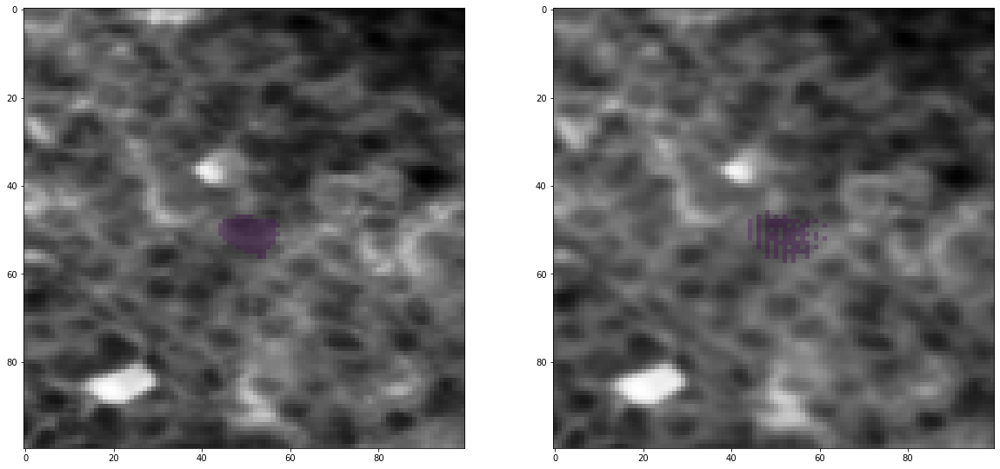

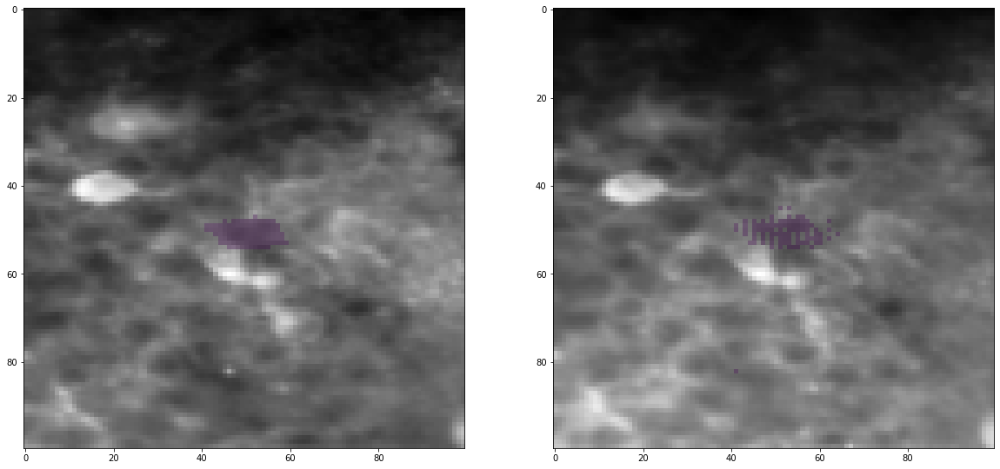

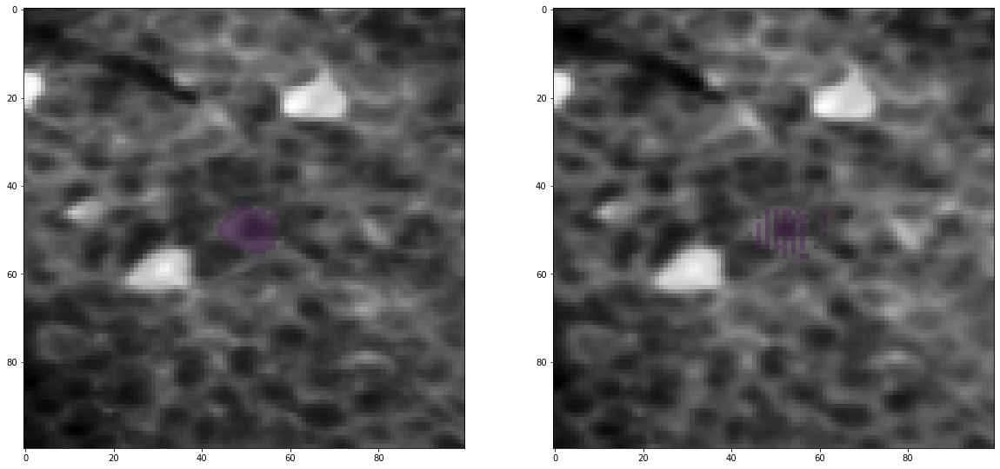

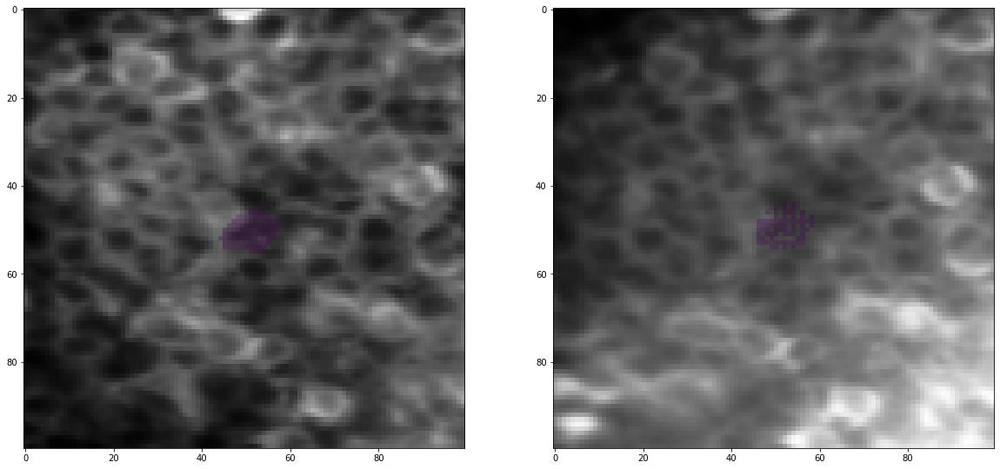

...

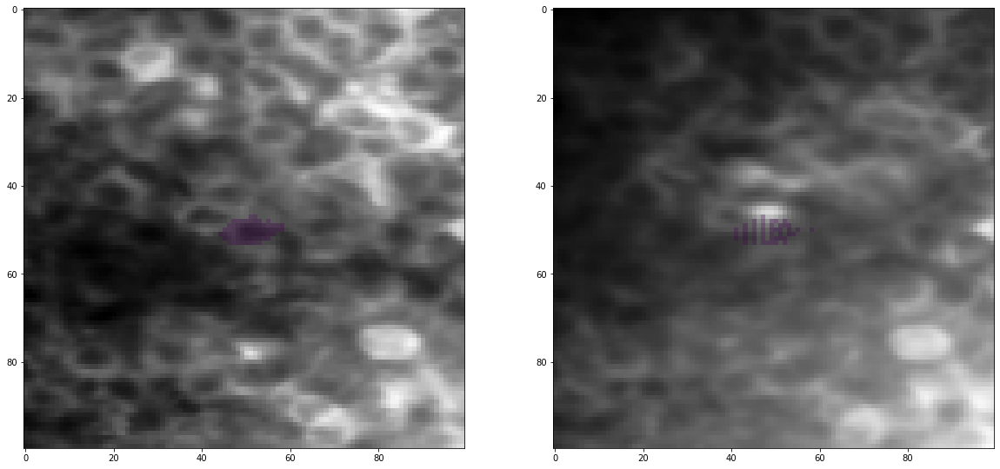

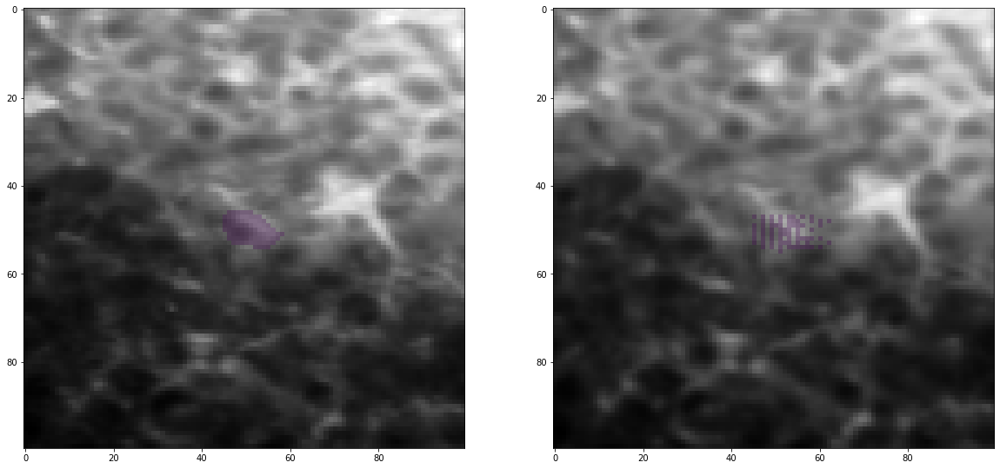

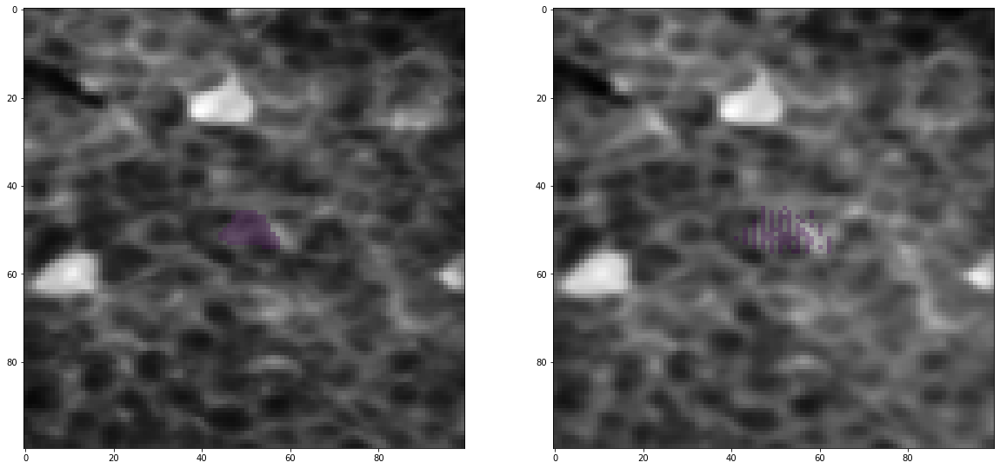

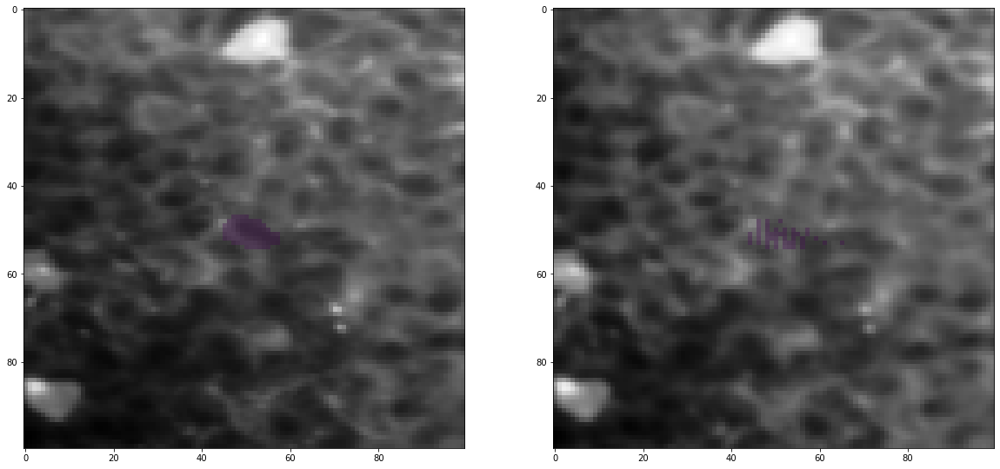

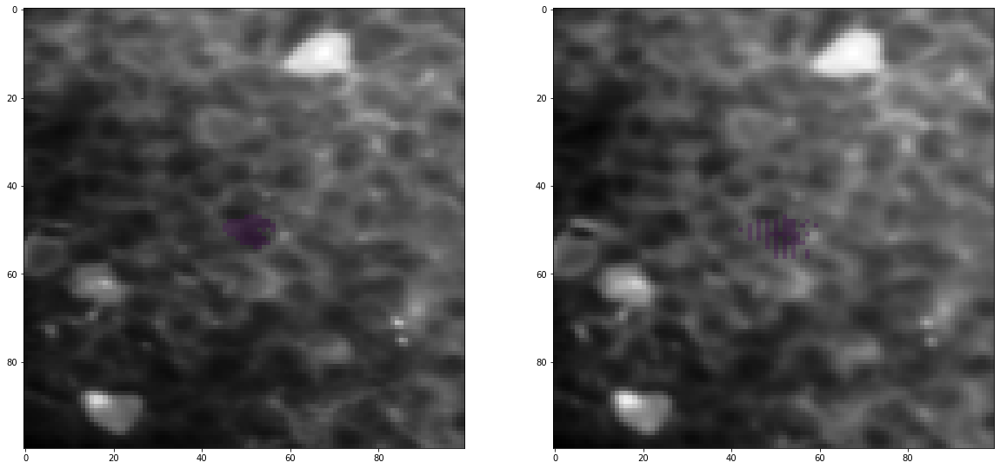

In [65]:
for ind in range(124):
    pix_ref = np.argwhere(roistack_ref[matched_ref[ind],:].reshape([512,796]))
    com_ref = pix_ref.mean(axis=0)
    pix_targ = np.argwhere(roistack_targ[matched_targ[ind],:].reshape([512,796]))
    com_targ = pix_targ.mean(axis=0)
    
    ybounds = [int(max(0,com_ref[0]-50)), int(min(512,com_ref[0]+50))]
    xbounds = [int(max(0,com_ref[1]-50)), int(min(796,com_ref[1]+50))]

    fig,ax = plt.subplots(1,2,figsize=[20,10])
    ax[0].imshow(file_list[0]['ops']['meanImg'][ybounds[0]:ybounds[1],xbounds[0]:xbounds[1]],cmap='Greys_r')
    ax[1].imshow(frames[1,ybounds[0]:ybounds[1],xbounds[0]:xbounds[1]],cmap='Greys_r')

    roi = np.zeros([512,796])*np.nan
    roi[pix_ref[:,0],pix_ref[:,1]]=1
    ax[0].imshow(roi[ybounds[0]:ybounds[1],xbounds[0]:xbounds[1]],alpha=.3)

    roi = np.zeros([512,796])*np.nan
    roi[pix_targ[:,0],pix_targ[:,1]]=1
    ax[1].imshow(roi[ybounds[0]:ybounds[1],xbounds[0]:xbounds[1]],alpha=.3)

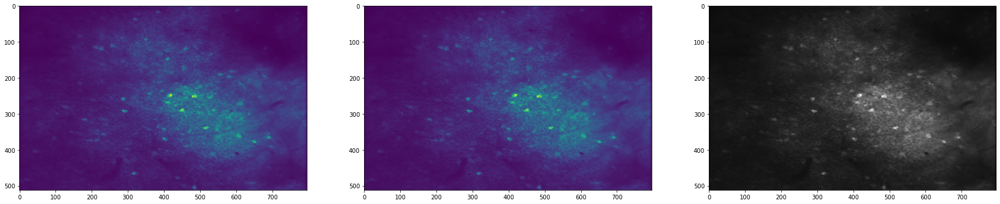

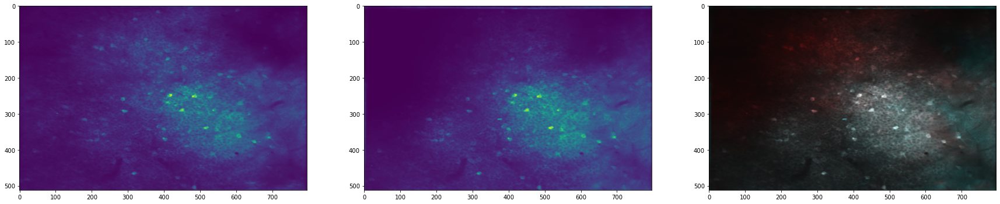

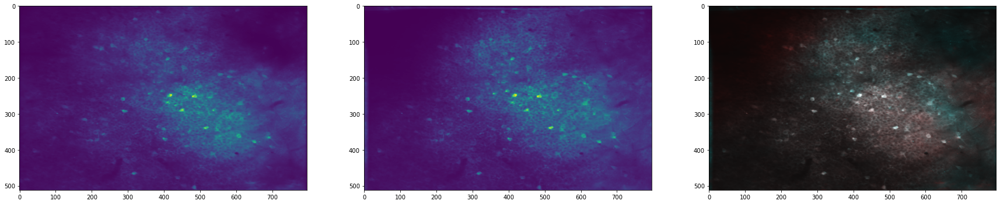

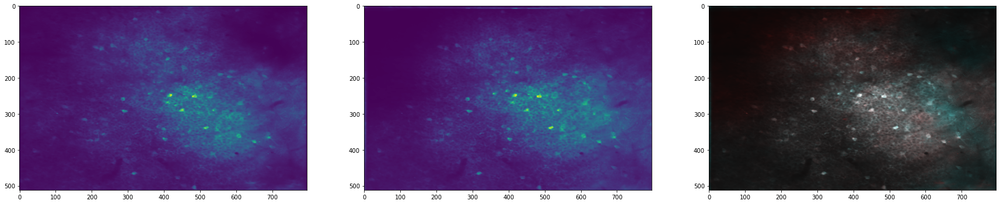

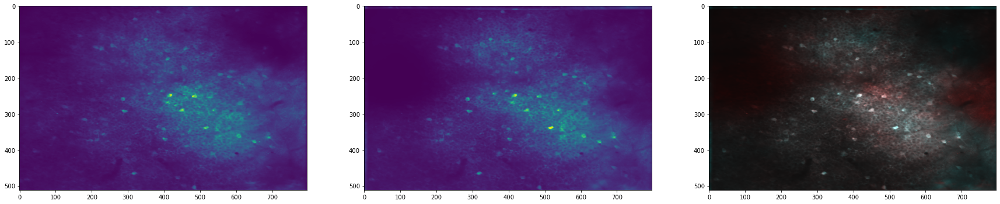

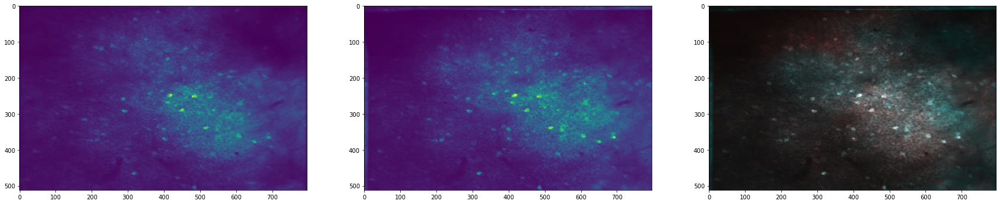

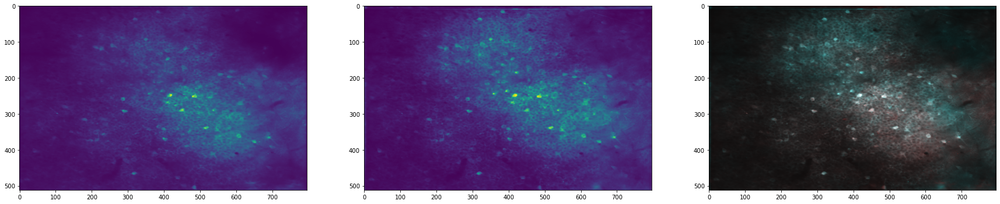

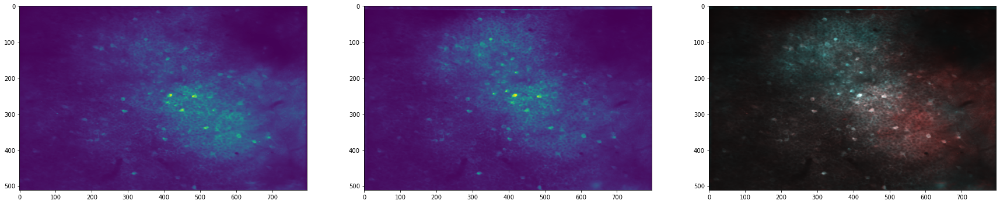

In [ ]:
for i,file in enumerate(file_list):
    fig,ax = plt.subplots(1,3,figsize=[30,10])
    ref,targ = file_list[0]['ops']['meanImg'], frames[i,:,:]
    ax[0].imshow(ref)
    ax[1].imshow(targ)
    img = np.zeros([*ref.shape,3])
    img[:,:,0] = ref/np.amax(ref)
    img[:,:,1] = targ/np.amax(targ)
    img[:,:,2] = targ/np.amax(targ)
    
    ax[2].imshow(img)

In [4]:
# make roi images for both days

In [5]:
# apply alignment matrix to one of those days

In [ ]:
# for each roi from ref day
    
    # find ROIs with >=50% overlap 
    
    # save these as potential matches, ranked by amount of overlap
    
    
    